In [1]:
import pandas as pd
import gc
import re
import numpy as np
import torch
import datasets
# from datasets import Dataset, ClassLabel
import transformers
import warnings 
warnings.filterwarnings("ignore")
from tqdm import tqdm
tqdm.pandas()
from pathlib import Path
import librosa
import librosa.display
import IPython.display as ipd
from IPython.display import Audio
import torchaudio
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from os.path import isfile, isdir, dirname
from os import mkdir
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
from pydub import AudioSegment
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from torch.cuda.amp import autocast, GradScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

c:\Users\matan\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
RATE_HZ = 16000 # resampling rate in Hz
MAX_LENGTH = 480000 # maximum audio interval length to consider (= RATE_HZ * SECONDS)
labels = ['cuphead', 'minecraft', 'undertale', 'doom', 'kirby', 'celeste', 'rocket league', 'stardew valley']
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

print(id2label, '\n\n', label2id)

{0: 'cuphead', 1: 'minecraft', 2: 'undertale', 3: 'doom', 4: 'kirby', 5: 'celeste', 6: 'rocket league', 7: 'stardew valley'} 

 {'cuphead': 0, 'minecraft': 1, 'undertale': 2, 'doom': 3, 'kirby': 4, 'celeste': 5, 'rocket league': 6, 'stardew valley': 7}


In [4]:
def load_data():
    file_list = []
    label_list = []
    for folder in Path(r'./CQT spectrograms').glob('*'):
        for file in Path(folder).glob('*.npy'):
            file_list.append(file)
            label_list.append(label2id[str(folder).split('\\')[1]])
    dataset = pd.DataFrame()
    dataset['file'] = file_list
    dataset['label'] = label_list
    return dataset

In [5]:
dataset = load_data()
dataset.head()

,file,label
0,CQT spectrograms\celeste\0.npy,5
1,CQT spectrograms\celeste\1.npy,5
2,CQT spectrograms\celeste\10.npy,5
3,CQT spectrograms\celeste\100.npy,5
4,CQT spectrograms\celeste\101.npy,5


In [6]:
def get_spec_from_file(file):
    return np.load(file)

In [7]:
class AudioDataset(Dataset):
    def __init__(self, dataframe,):
        self.dataframe = dataframe

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        file_path = row["file"]  # Adjust if your column name is different
        label = row["label"]
        image = np.load(file_path)
        image = np.expand_dims(image, axis=0)
        return {
            "input_values": image,  # Ensure correct shape
            "label": torch.tensor(label, dtype=torch.long),
        }

In [8]:
train_df, test_df = train_test_split(dataset, test_size=0.2, random_state=42)

In [9]:
train_dataset = AudioDataset(dataframe=train_df)#.shuffle().select(range(938))  # Using a subset (adjust accordingly)
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_dataset = AudioDataset(dataframe=test_df)#.shuffle().select(range(938))  # Using a subset (adjust accordingly)
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=True)

In [9]:
np.load(dataset['file'][2]).shape

(252, 1292)

# ${\color{pink}{CNN-Part:}}$

In [10]:
class CNN(nn.Module):
    def __init__(self, dropout=0.3):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=1,out_channels=8, kernel_size=(3,20), stride=2, padding=0)   #32 filters : 3x3
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)            #2x2 Maxpool
        self.conv2 = nn.Conv2d(8, 16, kernel_size=(3,20), stride=2, padding=0)  #64 filters: 3x3 
        self.dropout = nn.Dropout(dropout)  # Added dropout layer
        self.conv3 = nn.Conv2d(16, 32, kernel_size=(3,20), stride=1, padding=0)  #64 filters: 3x3 
        self.fc1 = nn.Linear(5376, 512)                            #this
        self.fc2 = nn.Linear(512, 8)                                        #this one...

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.pool(torch.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)  # Flatten
        x = self.dropout(x)  # Apply dropout
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x
model = CNN()
print(f"parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6}M")

parameters: 2.796064M


# ${\color{pink}{Experiments:}}$

In [57]:
from skorch import NeuralNetClassifier
from sklearn.model_selection import GridSearchCV
# Define the skorch neural net classifier
net = NeuralNetClassifier(
    CNN,
    max_epochs=5,
    lr=0.01,
    optimizer=optim.Adam,
    criterion=nn.CrossEntropyLoss,
    batch_size=64,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

# Prepare the data
X = [data['input_values'] for data in train_dataset]
y = [data['label'] for data in train_dataset]

# Define the parameter grid
params = {
    'lr': [0.001, 0.0001],
    'max_epochs': [5],
    'module__dropout': [0.3, 0.5],
    'optimizer': [optim.Adam, optim.SGD],
    'optimizer__weight_decay': [0, 0.0001]
}

# Perform Grid Search
gs = GridSearchCV(net, params, refit=True, cv=3, scoring='accuracy')

import numpy as np
X = np.array(X)
y = np.array(y)

gs.fit(X, y)

# Print the best score and parameters
print('Best score:', gs.best_score_)
print('Best params:', gs.best_params_)

# Use the best model
best_net = gs.best_estimator_

# Test the best model on test data
X_test = [data['input_values'] for data in test_dataset]
y_test = [data['label'] for data in test_dataset]
X_test = np.array(X_test)
y_test = np.array(y_test)

test_acc = best_net.score(X_test, y_test)
print('Test Accuracy:', test_acc)

  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        4.7921       0.1300        2.0994  0.9218
      2        2.0806       0.1200        2.0795  0.6533
      3        2.0861       0.1200        2.0794  0.6618
      4        2.0794       0.1200        2.0794  0.6568
      5        2.0793       0.1200        2.0793  0.6932
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        2.2680       0.1800        2.0719  0.6639
      2        2.0699       0.1400        2.0603  0.6601
      3        2.0413       0.1700        2.0082  0.6817
      4        1.9428       0.1900        1.9508  0.6742
      5        1.7728       0.3000        1.8174  0.6693
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        4.3244       0.1400        2.5018  0.6671
      2        2.2217       0.1

Epoch 1/20, Train Loss: 2.0609, Val Loss: 1.7318
Epoch 2/20, Train Loss: 1.5566, Val Loss: 1.5785
Epoch 3/20, Train Loss: 1.2064, Val Loss: 1.2561
Epoch 4/20, Train Loss: 0.7775, Val Loss: 1.2167
Epoch 5/20, Train Loss: 0.4977, Val Loss: 1.3025
Epoch 6/20, Train Loss: 0.2886, Val Loss: 1.0323
Epoch 7/20, Train Loss: 0.1810, Val Loss: 1.1436
Epoch 8/20, Train Loss: 0.0773, Val Loss: 1.0368
Epoch 9/20, Train Loss: 0.0711, Val Loss: 1.2495
Epoch 10/20, Train Loss: 0.1559, Val Loss: 1.1257
Epoch 11/20, Train Loss: 0.0447, Val Loss: 1.0798
Epoch 12/20, Train Loss: 0.0314, Val Loss: 1.0269
Epoch 13/20, Train Loss: 0.0248, Val Loss: 1.0345
Epoch 14/20, Train Loss: 0.0205, Val Loss: 1.0608
Epoch 15/20, Train Loss: 0.0163, Val Loss: 1.0523
Epoch 16/20, Train Loss: 0.0147, Val Loss: 1.0656
Epoch 17/20, Train Loss: 0.0140, Val Loss: 1.0616
Epoch 18/20, Train Loss: 0.0139, Val Loss: 1.0607
Epoch 19/20, Train Loss: 0.0142, Val Loss: 1.0679
Epoch 20/20, Train Loss: 0.0118, Val Loss: 1.0694


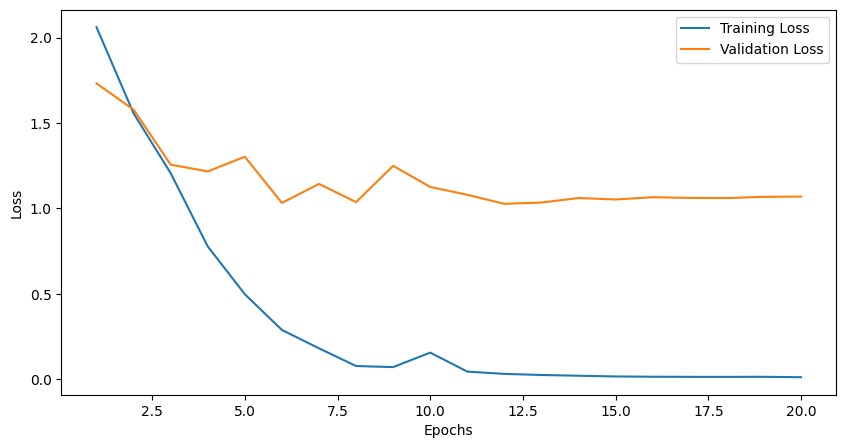

In [11]:
# Initialize the model, loss function, and optimizer
model = CNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, verbose=True)
num_epochs = 20
def train(model, criterion, optimizer, scheduler):
    train_losses = []
    val_losses = []
    epoch = 0
    for epoch in range(num_epochs):
        running_loss = 0.0
        model.train()
        for spec in train_dataloader:
            inputs, labels = spec['input_values'].to(device), spec['label'].to(device)
            optimizer.zero_grad()          # Reset gradients
            outputs = model(inputs) # Forward pass
            loss = criterion(outputs, labels)  # Compute loss
            loss.backward()                # Backpropagation
            optimizer.step()               # Update weights
            running_loss += loss.item()

        # Validation phase
        if epoch%1 == 0:
            train_loss = running_loss/len(train_dataloader)
            train_losses.append(train_loss)
            model.eval()
            val_loss = 0.0
            with torch.no_grad():
                for spec in test_dataloader:
                    inputs, labels = spec['input_values'].to(device), spec['label'].to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
            val_loss = val_loss/len(test_dataloader)
            val_losses.append(val_loss)
            scheduler.step(val_loss)
            print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    return epoch, train_losses, val_losses

def load(save_path):
    # Load the saved session
    checkpoint = torch.load(save_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_loss']
    val_losses = checkpoint['val_loss']
    return epoch, train_losses, val_losses

epoch = 0
train_losses = None
val_losses = None
# if isfile(SAVE_PATH):
#     epoch, train_losses, val_losses = load(SAVE_PATH)
# else:
#     epoch, train_losses, val_losses = train(model, criterion, optimizer, scheduler)
epoch, train_losses, val_losses = train(model, criterion, optimizer, scheduler)
# Plotting training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, int(num_epochs) + 1), train_losses, label='Training Loss')
plt.plot(range(1, int(num_epochs) + 1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [12]:
def predict_file(file_path):
    inputs = torch.from_numpy(np.expand_dims(np.load(file_path),axis=0))
    inputs = inputs.unsqueeze(0)
    inputs =inputs.to(device)
    with torch.no_grad():
        outputs = model(inputs)
        predicted_label = torch.argmax(outputs, dim=-1).item()
    return predicted_label

In [27]:
y_true = [label for label in test_df['label']]  # Ground truth
y_pred = [predict_file(file) for file in test_df['file']]  # Model predictions

In [24]:
correct=0
for i in range(len(test_df)):
    if y_true[i]==y_pred[i]: correct+=1
print("correct guesses:",correct)
print("accuracy:", 100*correct/len(test_df),'%')

correct guesses: 146
accuracy: 77.65957446808511 %


In [29]:
model.to(device)
model.eval()
y_true = [dataset['label'][i] for i in range(len(dataset))]  # Ground truth
y_pred = [predict_file(dataset['file'][i]) for i in range(len(dataset))]  # Model predictions

In [21]:
correct = 0
for i in range(len(dataset)):
    if y_true[i]==y_pred[i]: correct+=1
print("correct guesses:",correct)
print("accuracy:", 100*correct/len(dataset),'%')

correct guesses: 896
accuracy: 95.5223880597015 %


In [53]:
len(test_df)

188

<Figure size 800x800 with 0 Axes>

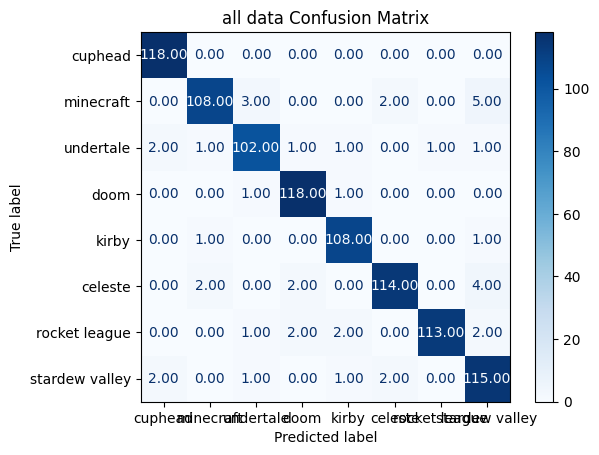

In [26]:
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp.plot(cmap=plt.cm.Blues, values_format=".2f")
plt.title("all data Confusion Matrix")
plt.show()

<Figure size 800x800 with 0 Axes>

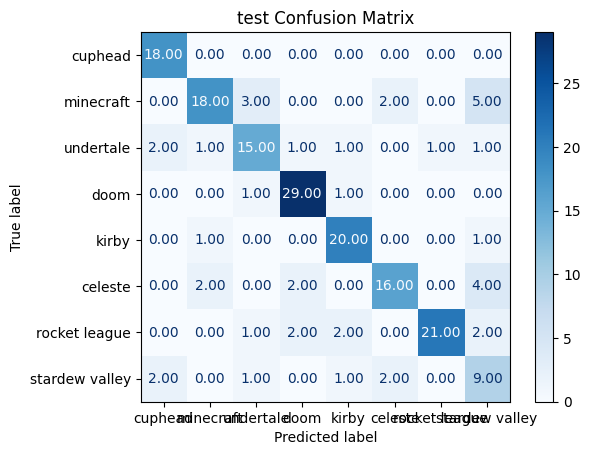

In [28]:
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp.plot(cmap=plt.cm.Blues, values_format=".2f")
plt.title("test Confusion Matrix")
plt.show()

In [ ]:
def load_data():
    file_list = []
    label_list = []
    for folder in Path(r'./30 sec train').glob('*'):
        for file in Path(folder).glob('*.wav'):
            file_list.append(file)
            label_list.append(label2id[str(folder).split('\\')[1]])
    dd = pd.DataFrame()
    dd['file'] = file_list
    dd['label'] = label_list
    return dd

In [ ]:
# Load model directly
from transformers import AutoFeatureExtractor, AutoModelForAudioClassification

feature_extractor = AutoFeatureExtractor.from_pretrained("artyomboyko/distilhubert-finetuned-gtzan")
model = AutoModelForAudioClassification.from_pretrained("artyomboyko/distilhubert-finetuned-gtzan")
model.config.id2label = id2label

In [ ]:
print(f"parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6}M")

parameters: 23.691402M


In [ ]:
# model.classifier = nn.Linear(in_features=256,out_features=len(labels))
model.classifier = nn.Sequential(
    nn.Linear(model.classifier.in_features, 128),  
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(128, 8)  # Output layer for 10 classes
)
model.named_parameters #find the layers we want to work with

<bound method Module.named_parameters of HubertForSequenceClassification(
  (hubert): HubertModel(
    (feature_extractor): HubertFeatureEncoder(
      (conv_layers): ModuleList(
        (0): HubertGroupNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
          (activation): GELUActivation()
          (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        )
        (1-4): 4 x HubertNoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
        (5-6): 2 x HubertNoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): HubertFeatureProjection(
      (projection): Linear(in_features=512, out_features=768, bias=True)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): HubertEncoder(
      (pos_co

In [ ]:
train_dataset = AudioDataset(dataframe=train_df,feature_extractor=feature_extractor, rate_hz=RATE_HZ)#.shuffle().select(range(938))  # Using a subset (adjust accordingly)
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True)
test_dataset = AudioDataset(dataframe=test_df,feature_extractor=feature_extractor, rate_hz=RATE_HZ)#.shuffle().select(range(938))  # Using a subset (adjust accordingly)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=True)

In [ ]:
gc.collect()

122

In [ ]:
SAVE_PATH = ".\\song_identify_model\\model_400.pth"
SAVE_PATH_DIRECTORY = dirname(SAVE_PATH)

In [ ]:
for name, param in model.named_parameters():
    if "classifier" not in name:  # Or any specific layer name that you want to keep trainable
        param.requires_grad = False
    else:
        param.requires_grad = True
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e3}K")

Trainable parameters: 33.928K


In [ ]:
def predict(logit):
    predicted_label = torch.argmax(logit, dim=-1).item()
    return predicted_label

In [ ]:
def eval_accuracy_loss(model, criterion):
    val_loss=0
    train_loss=0
    correct_train = 0
    correct_test = 0
    running_loss = 0.0
    model.eval()
    with torch.no_grad():
        for batch in tqdm(train_dataloader):
            inputs, labels = batch["input_values"].to(device), batch["label"].to(device)           
            outputs = model(inputs).logits
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            for i in range(len(outputs)):
                if predict(outputs[i]) == labels[i]: correct_train+=1
            gc.collect()
            torch.cuda.empty_cache()
        train_loss = running_loss/len(train_dataloader)
        val_loss = 0.0
        for inputs, labels in tqdm(test_dataloader):
            inputs, labels = batch["input_values"].to(device), batch["label"].to(device)     
            outputs = model(inputs).logits
            loss = criterion(outputs, labels)
            for i in range(len(outputs)):
                if predict(outputs[i]) == labels[i]: correct_test+=1
            val_loss += loss.item()
        val_loss = val_loss/len(test_dataloader)
        print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        print(f"train accuracy: {correct_train/len(train_df)}")
        print(f"test accuracy: {correct_test/len(test_df)}")
        print(f"total accuracy: {(correct_test+correct_train)/(len(dataset))}")
        gc.collect()
        torch.cuda.empty_cache()


In [ ]:
# model.to(device)
# eval_accuracy_loss(model,nn.CrossEntropyLoss()) 
#Train Loss: 2.0725, Val Loss: 2.0601
#accuracy: 0.16631130063965885

In [ ]:
gc.collect()
torch.cuda.empty_cache()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-04)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, verbose=True)
num_epochs = 10
def train(model, criterion, optimizer, scheduler):
    train_losses = []
    val_losses = []
    epoch = 0
    for epoch in range(num_epochs):
        running_loss = 0.0
        model.train()
        for batch in tqdm(train_dataloader):
            inputs, labels = batch["input_values"].to(device), batch["label"].to(device)
            optimizer.zero_grad()   # Reset gradients           
            # with autocast():  # This automatically uses FP16 for calculations
            #     outputs = model(inputs)
            #     loss = criterion(outputs.logits, labels)
            outputs = model(inputs)
            loss = criterion(outputs.logits, labels)
            loss.backward()                # Backpropagation
            optimizer.step()               # Update weights
            running_loss += loss.item()
            gc.collect()
            torch.cuda.empty_cache()
            

        # Validation phase
        train_loss = running_loss/len(train_dataloader)
        train_losses.append(train_loss)
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for inputs, labels in tqdm(test_dataloader):
                inputs, labels = batch["input_values"].to(device), batch["label"].to(device)
                outputs = model(inputs).logits
                loss = criterion(outputs, labels)
                val_loss += loss.item()
        val_loss = val_loss/len(test_dataloader)
        val_losses.append(val_loss)
        scheduler.step(val_loss)
        if len(val_losses)>1:
            if val_loss<val_losses[epoch-1]:
                torch.save({
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'epoch': epoch,
                    'train_loss': train_losses,
                    'val_loss': val_losses
                }, SAVE_PATH)
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        gc.collect()
        torch.cuda.empty_cache()
            
        gc.collect()
    return epoch, train_losses, val_losses

def load(save_path):
    # Load the saved session
    checkpoint = torch.load(save_path,weights_only=False)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_loss']
    val_losses = checkpoint['val_loss']
    return epoch, train_losses, val_losses

epoch = 0
train_losses = None
val_losses = None
# if isfile(SAVE_PATH):
if isfile(SAVE_PATH):
    epoch, train_losses, val_losses = load(SAVE_PATH)
else:
    epoch, train_losses, val_losses = train(model, criterion, optimizer, scheduler)

# Plotting training and validation loss


In [ ]:
for name, param in model.named_parameters():
    param.requires_grad = False

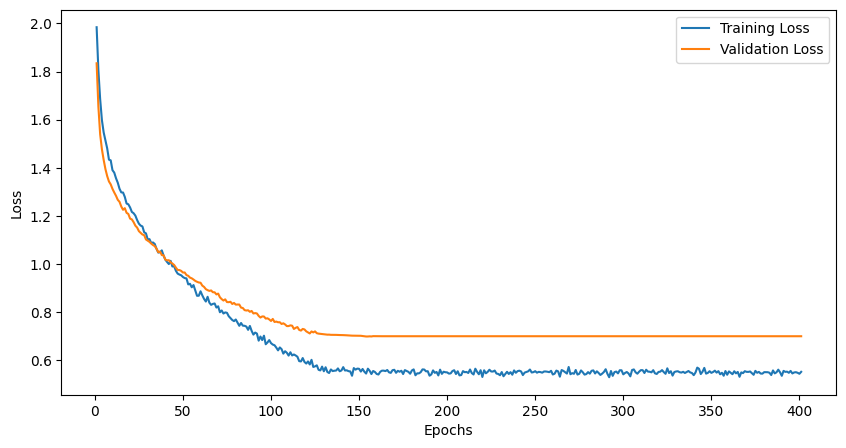

In [ ]:
# print(val_losses)
# print(train_losses)
plt.figure(figsize=(10, 5))
plt.plot(range(1, int(401) + 1), train_losses, label='Training Loss')
plt.plot(range(1, int(401) + 1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:

# if not isdir(SAVE_PATH_DIRECTORY):
#     mkdir(SAVE_PATH_DIRECTORY)
# torch.save({
#     'model_state_dict': model.state_dict(),
#     'optimizer_state_dict': optimizer.state_dict(),
#     'epoch': epoch,
#     'train_loss': train_losses,
#     'val_loss': val_losses
# }, SAVE_PATH)

In [ ]:
import random
rand = random.randint(0, len(dataset) - 1)
sample = dataset["file"][rand]
audio_input = get_transform_audio(sample)
print("expected: ", id2label[dataset["label"][rand]])
# Preprocess with feature extractor
inputs = feature_extractor(audio_input, sampling_rate=RATE_HZ, return_tensors="pt")
inputs.to(device)

# Run the model for inference
with torch.no_grad():
    logits = model(**inputs).logits

# Get the predicted label
predicted_label_id = torch.argmax(logits, dim=-1).item()
# predicted_label = model.config.id2label[predicted_label_id]
predicted_label = id2label[predicted_label_id]
print(f"Predicted Genre: {predicted_label}")
Audio(sample)

expected:  cuphead
Predicted Genre: cuphead


In [ ]:
def predict_file(file_path):
    inputs = get_transform_audio(file_path)
    inputs = feature_extractor(inputs, sampling_rate=RATE_HZ, return_tensors="pt")
    inputs.to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_label = torch.argmax(logits, dim=-1).item()
    return predicted_label


In [ ]:
y_true = [label for label in test_df['label']]  # Ground truth
y_pred = [predict_file(file) for file in test_df['file']]  # Model predictions

In [ ]:
correct=0
for i in range(len(test_df)):
    if y_true[i]==y_pred[i]: correct+=1
print("accuracy:", 100*correct/len(test_df),'%')

accuracy: 75.0 %


In [ ]:
y_true = [dataset['label'][i] for i in range(len(dataset))]  # Ground truth
y_pred = [predict_file(dataset['file'][i]) for i in range(len(dataset))]  # Model predictions

In [ ]:
correct=0
for i in range(len(dataset)):
    if y_true[i]==y_pred[i]: correct+=1
print("accuracy:", 100*correct/len(dataset),'%')

accuracy: 81.55650319829424 %


<Figure size 800x800 with 0 Axes>

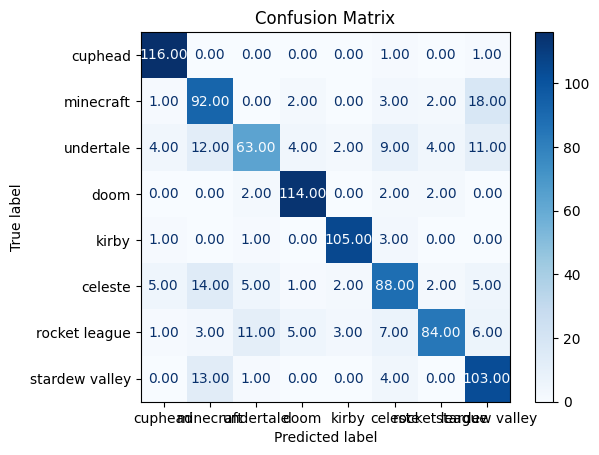

In [ ]:
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp.plot(cmap=plt.cm.Blues, values_format=".2f")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
dataset = load_data()
print("we have:",dataset.shape[0], "songs")
dataset.head()

we have: 938 songs


,file,label
0,"30 sec train\celeste\celestesong_num_0,sample_...",5
1,"30 sec train\celeste\celestesong_num_0,sample_...",5
2,"30 sec train\celeste\celestesong_num_0,sample_...",5
3,"30 sec train\celeste\celestesong_num_0,sample_...",5
4,"30 sec train\celeste\celestesong_num_0,sample_...",5


In [ ]:
train_df, test_df = train_test_split(dataset, test_size=0.2, random_state=42)

In [ ]:
torchaudio.set_audio_backend("soundfile")
print(torchaudio.list_audio_backends())

['soundfile']


In [ ]:
def get_transform_audio(file):
    audio,rate = torchaudio.load(str(file).replace('\\','/'))
    if audio.shape[0] > 1:  # If audio is sterio, turn it to mono
        audio = torch.mean(audio, dim=0, keepdim=True)
    transform = torchaudio.transforms.Resample(rate,RATE_HZ)
    audio = transform(audio).squeeze(0).numpy()
    audio = audio[:MAX_LENGTH]
    return audio # truncate to first part of audio to save RAM


In [ ]:
class AudioDataset(Dataset):
    def __init__(self, dataframe, feature_extractor, rate_hz):
        self.dataframe = dataframe
        self.feature_extractor = feature_extractor
        self.rate_hz = rate_hz

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        file_path = row["file"]  # Adjust if your column name is different
        label = row["label"]

        # Load and preprocess audio
        audio_input = get_transform_audio(file_path)
        inputs = self.feature_extractor(audio_input, sampling_rate=self.rate_hz, return_tensors="pt")

        return {
            "input_values": inputs["input_values"].squeeze(0),  # Ensure correct shape
            "label": torch.tensor(label, dtype=torch.long),
        }

In [ ]:
# Load model directly
from transformers import AutoFeatureExtractor, AutoModelForAudioClassification

feature_extractor = AutoFeatureExtractor.from_pretrained("artyomboyko/distilhubert-finetuned-gtzan")
model = AutoModelForAudioClassification.from_pretrained("artyomboyko/distilhubert-finetuned-gtzan")
model.config.id2label = id2label

In [ ]:
print(f"parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6}M")

parameters: 23.691402M


In [ ]:
model.classifier = nn.Linear(in_features=256,out_features=len(labels))
model.named_parameters #find the layers we want to work with

<bound method Module.named_parameters of HubertForSequenceClassification(
  (hubert): HubertModel(
    (feature_extractor): HubertFeatureEncoder(
      (conv_layers): ModuleList(
        (0): HubertGroupNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
          (activation): GELUActivation()
          (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        )
        (1-4): 4 x HubertNoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
        (5-6): 2 x HubertNoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): HubertFeatureProjection(
      (projection): Linear(in_features=512, out_features=768, bias=True)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): HubertEncoder(
      (pos_co

In [ ]:
train_dataset = AudioDataset(dataframe=train_df,feature_extractor=feature_extractor, rate_hz=RATE_HZ)#.shuffle().select(range(938))  # Using a subset (adjust accordingly)
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True)
test_dataset = AudioDataset(dataframe=test_df,feature_extractor=feature_extractor, rate_hz=RATE_HZ)#.shuffle().select(range(938))  # Using a subset (adjust accordingly)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=True)

In [ ]:
gc.collect()

71

In [ ]:
SAVE_PATH = ".\\song_identify_model\\model_epoch_370.pth"
SAVE_PATH_DIRECTORY = dirname(SAVE_PATH)

In [ ]:
for name, param in model.named_parameters():
    if "classifier" not in name and "projector" not in name:  # Or any specific layer name that you want to keep trainable
        param.requires_grad = False
    else:
        param.requires_grad = True
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e3}K")

Trainable parameters: 198.92K


In [ ]:
def predict(logit):
    predicted_label = torch.argmax(logit, dim=-1).item()
    return predicted_label

In [ ]:
def eval_accuracy_loss(model, criterion):
    val_loss=0
    train_loss=0
    correct_train = 0
    correct_test = 0
    running_loss = 0.0
    model.eval()
    with torch.no_grad():
        for batch in tqdm(train_dataloader):
            inputs, labels = batch["input_values"].to(device), batch["label"].to(device)           
            outputs = model(inputs).logits
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            for i in range(len(outputs)):
                if predict(outputs[i]) == labels[i]: correct_train+=1
            gc.collect()
            torch.cuda.empty_cache()
        train_loss = running_loss/len(train_dataloader)
        val_loss = 0.0
        for inputs, labels in tqdm(test_dataloader):
            inputs, labels = batch["input_values"].to(device), batch["label"].to(device)     
            outputs = model(inputs).logits
            loss = criterion(outputs, labels)
            for i in range(len(outputs)):
                if predict(outputs[i]) == labels[i]: correct_test+=1
            val_loss += loss.item()
        val_loss = val_loss/len(test_dataloader)
        print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        print(f"train accuracy: {correct_train/len(train_df)}")
        print(f"test accuracy: {correct_test/len(test_df)}")
        print(f"total accuracy: {(correct_test+correct_train)/(len(dataset))}")
        gc.collect()
        torch.cuda.empty_cache()


In [ ]:
gc.collect()
torch.cuda.empty_cache()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-04)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, verbose=True)
num_epochs = 10
def train(model, criterion, optimizer, scheduler):
    train_losses = []
    val_losses = []
    epoch = 0
    for epoch in range(num_epochs):
        running_loss = 0.0
        model.train()
        for batch in tqdm(train_dataloader):
            inputs, labels = batch["input_values"].to(device), batch["label"].to(device)
            optimizer.zero_grad()   # Reset gradients           
            # with autocast():  # This automatically uses FP16 for calculations
            #     outputs = model(inputs)
            #     loss = criterion(outputs.logits, labels)
            outputs = model(inputs)
            loss = criterion(outputs.logits, labels)
            loss.backward()                # Backpropagation
            optimizer.step()               # Update weights
            running_loss += loss.item()
            gc.collect()
            torch.cuda.empty_cache()
            

        # Validation phase
        train_loss = running_loss/len(train_dataloader)
        train_losses.append(train_loss)
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for batch in tqdm(test_dataloader):
                inputs, labels = batch["input_values"].to(device), batch["label"].to(device)
                outputs = model(inputs).logits
                loss = criterion(outputs, labels)
                val_loss += loss.item()
        val_loss = val_loss/len(test_dataloader)
        val_losses.append(val_loss)
        scheduler.step(val_loss)
        if len(val_losses)>1:
            if val_loss<val_losses[epoch-1]:
                torch.save({
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'epoch': epoch,
                    'train_loss': train_losses,
                    'val_loss': val_losses
                }, SAVE_PATH)
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        gc.collect()
        torch.cuda.empty_cache()
            
        gc.collect()
    return epoch, train_losses, val_losses

def load(save_path):
    # Load the saved session
    checkpoint = torch.load(save_path,weights_only=False)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_loss']
    val_losses = checkpoint['val_loss']
    return epoch, train_losses, val_losses

epoch = 0
train_losses = None
val_losses = None
# if isfile(SAVE_PATH):
if isfile(SAVE_PATH):
    epoch, train_losses, val_losses = load(SAVE_PATH)
else:
    # epoch, train_losses, val_losses = train(model, criterion, optimizer, scheduler)
    print("oh")

# Plotting training and validation loss


In [ ]:
for name, param in model.named_parameters():
    param.requires_grad = False

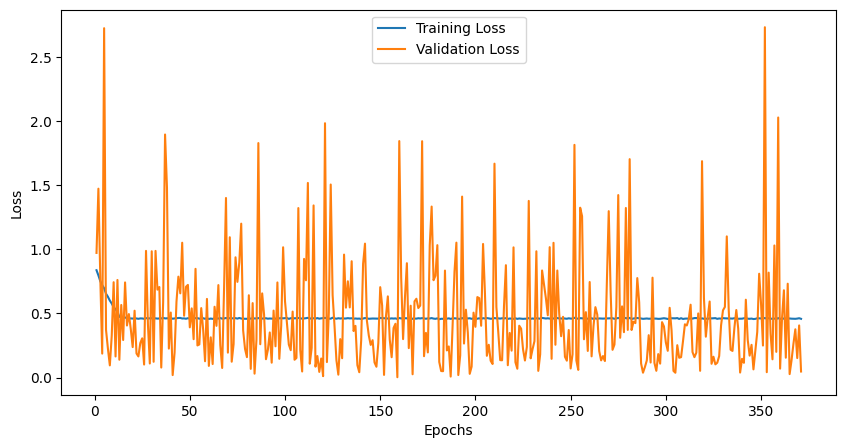

In [ ]:
# print(val_losses)
# print(train_losses)
plt.figure(figsize=(10, 5))
plt.plot(range(1, int(371) + 1), train_losses, label='Training Loss')
plt.plot(range(1, int(371) + 1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# if not isdir(SAVE_PATH_DIRECTORY):
#     mkdir(SAVE_PATH_DIRECTORY)
# torch.save({
#     'model_state_dict': model.state_dict(),
#     'optimizer_state_dict': optimizer.state_dict(),
#     'epoch': epoch,
#     'train_loss': train_losses,
#     'val_loss': val_losses
# }, SAVE_PATH)

In [ ]:
# import torch
# import torch.profiler

# def train_step(inputs, labels):
#     optimizer.zero_grad()
#     outputs = model(inputs)
#     loss = criterion(outputs.logits, labels)
#     loss.backward()
#     optimizer.step()
#     return loss.item()

# with torch.profiler.profile(
#     activities=[torch.profiler.ProfilerActivity.CPU, torch.profiler.ProfilerActivity.CUDA],
#     schedule=torch.profiler.schedule(wait=1, warmup=1, active=3, repeat=1),
#     on_trace_ready=torch.profiler.tensorboard_trace_handler('./log'),
#     record_shapes=True,
#     profile_memory=True,
#     with_stack=True
# ) as prof:
#     for i, batch in enumerate(train_dataloader):
#         if i>4: break
#         inputs, labels = batch["input_values"].to(device), batch["label"].to(device)
#         loss = train_step(inputs, labels)
#         prof.step()  # Step the profiler after each batch

# print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))


In [ ]:
import random
rand = random.randint(0, len(dataset) - 1)
sample = dataset["file"][rand]
audio_input = get_transform_audio(sample)
print("expected: ", id2label[dataset["label"][rand]])
# Preprocess with feature extractor
inputs = feature_extractor(audio_input, sampling_rate=RATE_HZ, return_tensors="pt")
inputs.to(device)

# Run the model for inference
with torch.no_grad():
    logits = model(**inputs).logits

# Get the predicted label
predicted_label_id = torch.argmax(logits, dim=-1).item()
# predicted_label = model.config.id2label[predicted_label_id]
predicted_label = id2label[predicted_label_id]
print(f"Predicted Genre: {predicted_label}")
Audio(sample)

expected:  celeste
Predicted Genre: celeste


In [ ]:
def predict_file(file_path):
    inputs = get_transform_audio(file_path)
    inputs = feature_extractor(inputs, sampling_rate=RATE_HZ, return_tensors="pt")
    inputs.to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_label = torch.argmax(logits, dim=-1).item()
    return predicted_label


In [ ]:
y_true = [label for label in test_df['label']]  # Ground truth
y_pred = [predict_file(file) for file in test_df['file']]  # Model predictions
correct=0
for i in range(len(test_df)):
    if y_true[i]==y_pred[i]: correct+=1
print("accuracy:", 100*correct/len(test_df),'%')

accuracy: 76.06382978723404 %


In [ ]:
y_true = [dataset['label'][i] for i in range(len(dataset))]  # Ground truth
y_pred = [predict_file(dataset['file'][i]) for i in range(len(dataset))]  # Model predictions

In [ ]:
correct=0
for i in range(len(dataset)):
    if y_true[i]==y_pred[i]: correct+=1
print("accuracy:", 100*correct/len(dataset),'%')

accuracy: 84.54157782515992 %


<Figure size 800x800 with 0 Axes>

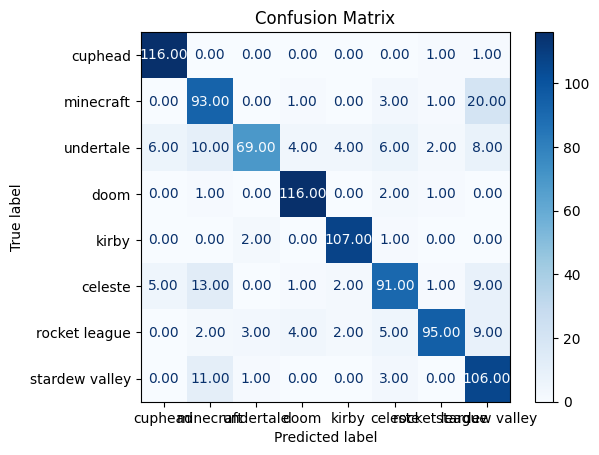

In [ ]:
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp.plot(cmap=plt.cm.Blues, values_format=".2f")
plt.title("Confusion Matrix")
plt.show()

# Results:

we tried 3 models on our data and their accuracy is: <br>
CNN: 77.6% <br>
Fine Tuned HuBert changing the projector and classifier layer: 75%<br>
Fine Tuned HuBert by adding another layer: 76%

As we can see, even though our CNN overfitted the original data, it still ended up being the most accurate one on the test dataset.

# Further Improvement:

We didnt end up doing the hyper parameters for the HuBert fine tuning since it was too computationally intense, so doing that would undoubtablly improve the fine tune results!

We also wanted to use facebook's wav2vec, which is 4x larger than Hubert and could yeald better results. However, due to its size and run time, we decided to go for Hubert instead

We might also benefit from improving our database with more songs but some of the games we chose simply didnt have enough songs to provide a easily distinguishable dataset with enough data points to train a model.

# Conclusion:

We decided to choose our CNN since it got us the best results on our test but we believe that a fine tuned model can be better with more optimizations